In [351]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [352]:
np.random.seed(42)

In [353]:
cluster_generator = CorrelatedClusterGenerator(n_samples=10000,n_features=20,n_clusters=5,correlation=0.8,random_state=42)

In [354]:
X, y = cluster_generator.generate_clusters()

In [355]:
X = X + np.random.normal(scale=3,size=X.shape) 

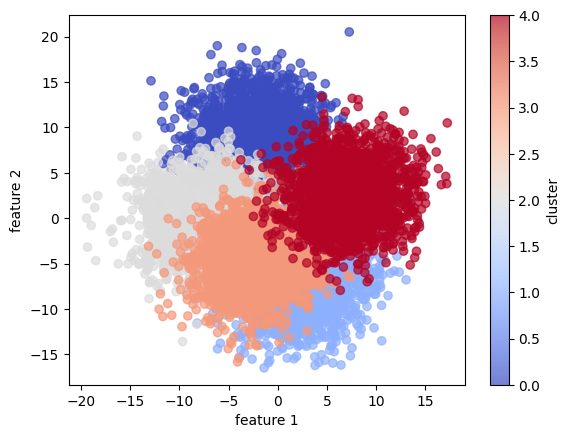

In [356]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

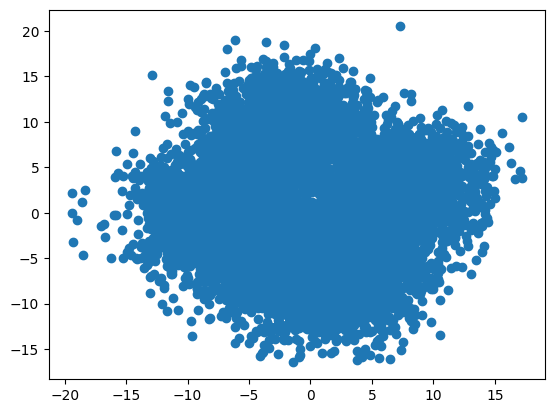

In [357]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [358]:
corr_dataset = pd.DataFrame(X) 

In [359]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [360]:
corr_dataset['target'] = y

In [361]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,6.306865,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,9.169825,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,7.776618,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,13.636632,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,6.364237,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,9.733478,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,7.789403,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,9.867706,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,3.467666,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4


In [362]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [363]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.023965,0.060958,-0.671575,0.249351,-0.115066,0.467883,-0.014150,0.403949,-0.032356,-0.442385,-0.131919,-0.141529,-0.081114,0.365234,-0.182209,0.321430,0.198300,0.067300,-0.129400
vab_2,-0.023965,1.000000,0.170188,0.151625,-0.353769,-0.620167,0.058880,0.353912,0.345557,0.247209,-0.552020,0.752714,0.658066,-0.678260,-0.628730,-0.597057,-0.147888,0.651730,-0.246250,-0.073415
vab_3,0.060958,0.170188,1.000000,-0.205607,-0.153574,-0.349601,-0.335500,0.575949,-0.391415,0.728554,-0.288955,-0.099253,-0.313533,-0.356036,-0.283232,-0.415764,0.546408,0.110198,0.302104,-0.208618
vab_4,-0.671575,0.151625,-0.205607,1.000000,-0.159265,0.158907,-0.360296,-0.020467,-0.149119,-0.144985,0.405155,0.308512,0.345102,0.085725,-0.338101,0.203799,-0.476388,-0.037328,-0.042868,0.306961
vab_5,0.249351,-0.353769,-0.153574,-0.159265,1.000000,0.374676,0.126385,-0.196520,0.076429,-0.259686,0.173605,-0.332844,-0.277368,0.368537,0.448802,0.301210,0.049988,-0.206703,0.222942,0.161435
vab_6,-0.115066,-0.620167,-0.349601,0.158907,0.374676,1.000000,-0.042904,-0.379348,-0.184048,-0.400960,0.650401,-0.497663,-0.373758,0.706096,0.538684,0.681214,-0.098706,-0.525479,0.202981,0.278889
vab_7,0.467883,0.058880,-0.335500,-0.360296,0.126385,-0.042904,1.000000,-0.199870,0.493479,-0.170820,-0.144409,0.145923,0.280018,0.061593,0.321023,0.072452,0.073004,0.186353,-0.456926,-0.196783
vab_8,-0.014150,0.353912,0.575949,-0.020467,-0.196520,-0.379348,-0.199870,1.000000,-0.186356,0.580874,-0.282069,0.177063,0.018233,-0.397990,-0.368487,-0.396165,0.326165,0.263430,0.094794,-0.151704
vab_9,0.403949,0.345557,-0.391415,-0.149119,0.076429,-0.184048,0.493479,-0.186356,1.000000,-0.419243,-0.431801,0.437392,0.507440,-0.218336,0.034530,-0.206150,-0.311171,0.449607,-0.208878,0.111565
vab_10,-0.032356,0.247209,0.728554,-0.144985,-0.259686,-0.400960,-0.170820,0.580874,-0.419243,1.000000,-0.186748,0.031439,-0.134470,-0.343889,-0.336617,-0.345885,0.585144,0.135769,-0.028678,-0.391500


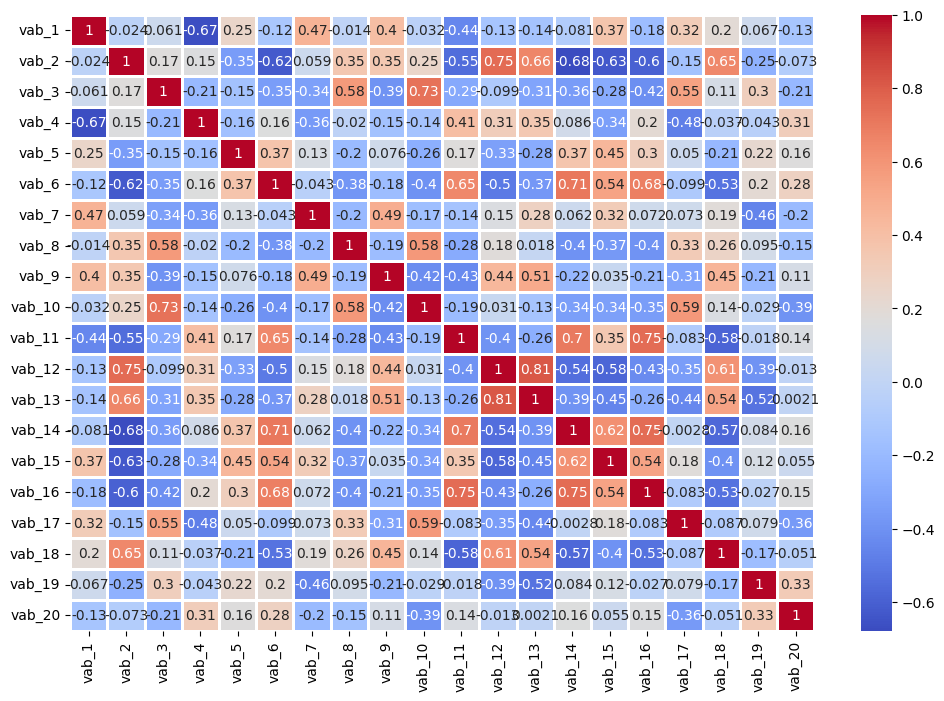

In [364]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [365]:
X_values = corr_dataset.iloc[:,:-1].values

In [366]:
y_values = corr_dataset.iloc[:,-1].values

In [367]:
scaler = StandardScaler()

In [368]:
X_values = scaler.fit_transform(X_values)

In [369]:
np.mean(X_values),np.std(X_values)

(-2.9672264645341783e-16, 1.0000000000000004)

In [370]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.379771,1.305501,0.209049,-0.356773,-1.273407,-2.225832,-0.644418,0.969154,0.159361,0.307397,-1.623444,0.690601,0.767384,-1.339323,-1.693383,-2.134424,0.120608,0.706258,0.311530,0.129827
1,-0.502301,0.972420,0.932610,0.448060,-0.973806,-1.658274,-0.654049,0.214578,0.304520,0.605736,-0.951833,1.089009,0.479188,-1.257702,-1.316219,-2.309495,-0.173000,1.005789,0.763903,0.825806
2,-0.373528,1.071722,0.599326,0.506581,-0.848178,-1.065655,-0.309361,0.897639,0.058949,0.261658,-2.253783,0.895131,0.637140,-2.113518,-1.182742,-1.944930,-0.550118,0.567186,1.203828,1.239338
3,0.062076,1.484086,1.094831,0.540585,-0.103001,-0.695721,-0.517001,1.137798,0.546130,0.967127,-0.215292,1.710606,0.284700,-1.587653,-1.684357,-1.384795,-0.296340,1.304382,0.804723,0.189206
4,0.148765,1.292420,0.538536,0.410130,-1.171192,-0.679206,-0.480749,1.866228,-0.234979,-0.023582,-0.534044,0.698585,1.011218,-1.110422,-1.477217,-1.518761,-0.706686,1.770946,0.764993,2.380180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.002224,-0.372339,-0.402201,-2.154381,-0.230478,-0.955291,1.286902,-0.334980,1.145232,0.042405,-2.000264,1.167446,0.544743,-0.206443,-0.183061,-1.558094,0.909907,1.517774,-1.772480,-0.873418
9996,1.109158,0.769410,0.053576,-1.578699,0.350248,-0.662080,1.401899,-1.235564,1.664493,-0.391091,-1.041891,0.896910,0.895254,0.279540,-0.242665,-1.070197,-0.253527,0.390535,-2.214155,-0.308278
9997,1.090341,-0.088747,0.044258,-1.454040,0.834545,-0.436063,0.880761,0.078567,0.984342,-0.024461,-0.715722,1.186125,0.693793,0.147854,1.002472,-0.917476,1.095653,0.606136,-0.965823,-1.338511
9998,0.834084,-0.249231,-0.421212,-1.167592,0.309143,-0.225390,1.245507,-1.522200,0.904203,-0.448239,-0.843743,0.295500,0.113507,0.129438,0.741832,0.338480,-0.349464,0.682880,-1.868537,-1.366102


<Axes: ylabel='Density'>

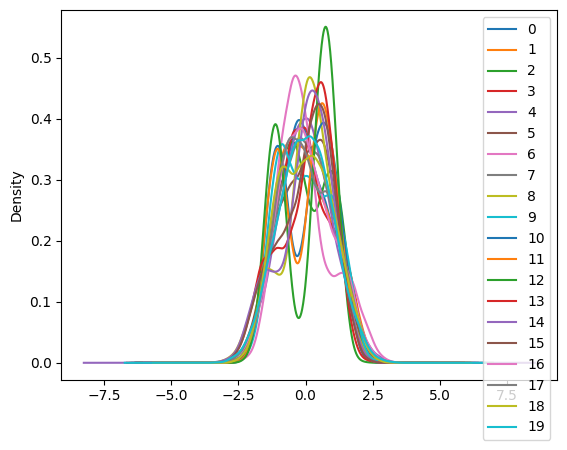

In [371]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [372]:
pca_general = PCA()

In [373]:
pca_general.fit(X_values)

PCA()

In [374]:
explained_variance = pca_general.explained_variance_ratio_

In [375]:
explained_variance

array([0.3154465 , 0.1902668 , 0.15087735, 0.08588368, 0.04330579,
       0.03019172, 0.02259734, 0.02103676, 0.01677155, 0.01474947,
       0.01394129, 0.01300211, 0.01214676, 0.01211718, 0.01172782,
       0.01122695, 0.00965799, 0.00931663, 0.00844843, 0.00728787])

In [376]:
eigenvalues = pca_general.explained_variance_

In [377]:
pd.DataFrame(eigenvalues)

,0
0,6.309561
1,3.805717
2,3.017849
3,1.717845
4,0.866202
5,0.603895
6,0.451992
7,0.420777
8,0.335465
9,0.295019


In [378]:
eigenvectors = pca_general.components_

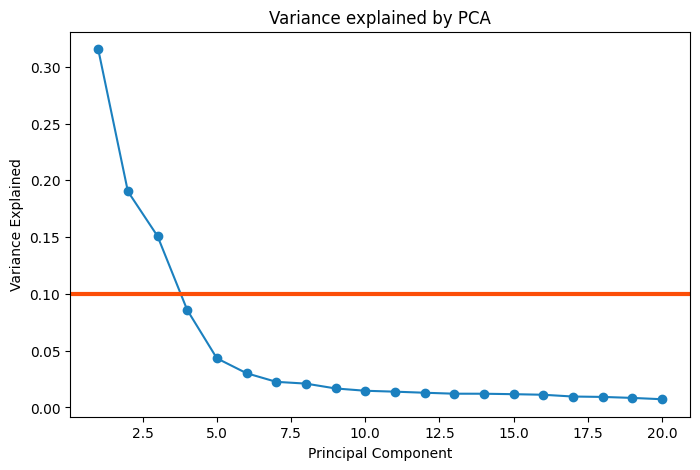

In [379]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [380]:
pca = PCA(n_components=4)

In [381]:
principal_components = pca.fit_transform(X_values)

In [382]:
pd.DataFrame(principal_components).head(8)

,0,1,2,3
0,4.355149,0.700428,-0.280340,1.025210
1,3.739239,0.407027,-1.184592,1.543378
2,3.860727,0.274425,-0.966081,2.356415
3,3.726685,0.463484,-1.142536,1.213763
4,3.406034,-0.222837,-1.517897,2.248412
5,3.958050,0.203383,-1.055384,0.700054
6,3.597528,-0.440143,-1.150726,0.864485
7,3.026486,0.899129,-1.793121,1.024710


In [383]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3','principal component 4'])

In [384]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [385]:
final_df

,principal component 1,principal component 2,principal component 3,principal component 4,target
0,4.355149,0.700428,-0.280340,1.025210,0
1,3.739239,0.407027,-1.184592,1.543378,0
2,3.860727,0.274425,-0.966081,2.356415,0
3,3.726685,0.463484,-1.142536,1.213763,0
4,3.406034,-0.222837,-1.517897,2.248412,0
...,...,...,...,...,...
9995,2.713139,-0.353316,2.884449,-1.112133,4
9996,1.904282,-1.635096,2.926389,-0.896601,4
9997,1.247260,0.068235,2.928283,-1.002039,4
9998,0.216381,-1.291437,2.774278,-1.499015,4


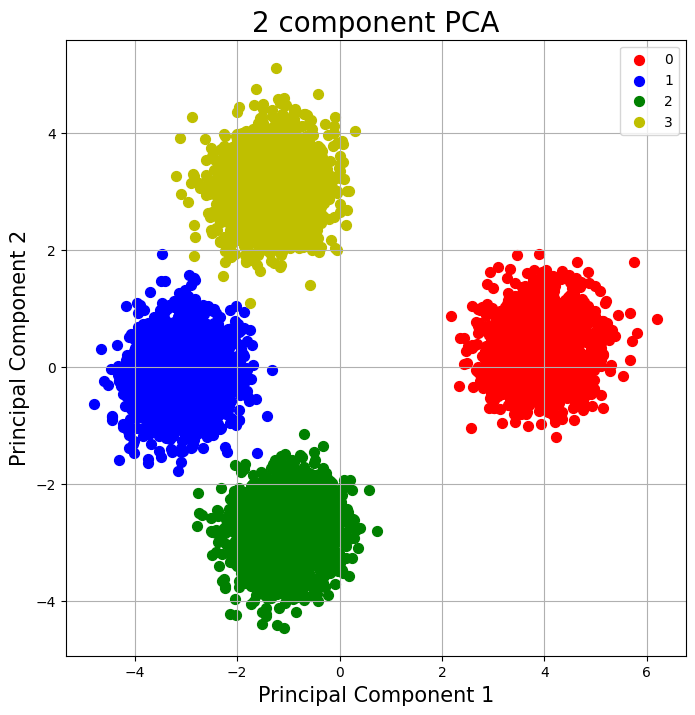

In [386]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

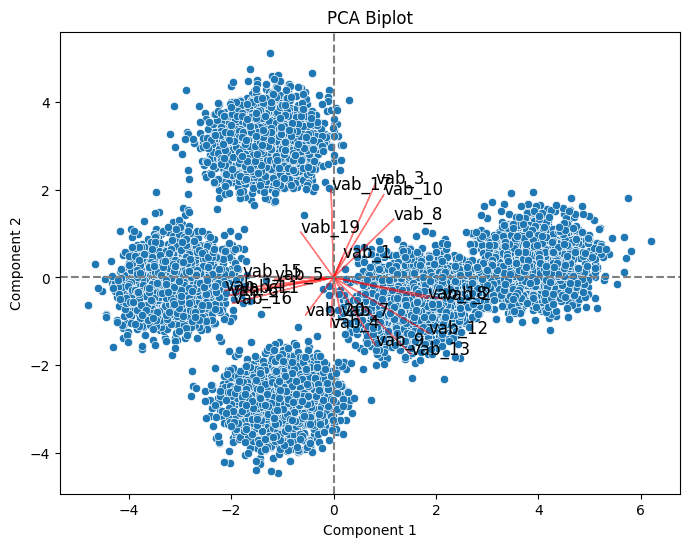

In [387]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

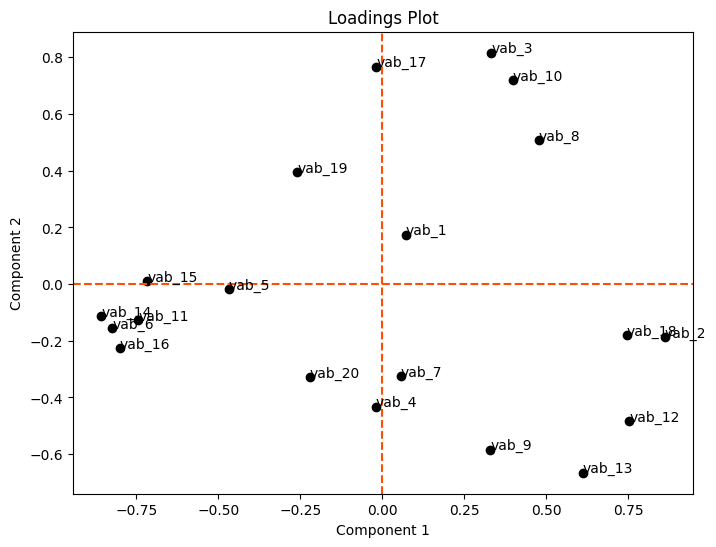

In [388]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [389]:
X_pca = pca.transform(X_values)

In [390]:
pd.DataFrame(X_pca).head()

,0,1,2,3
0,4.355149,0.700428,-0.280340,1.025210
1,3.739239,0.407027,-1.184592,1.543378
2,3.860727,0.274425,-0.966081,2.356415
3,3.726685,0.463484,-1.142536,1.213763
4,3.406034,-0.222837,-1.517897,2.248412


## t-SNE

In [391]:
tsne = TSNE(n_components=3,random_state=42)

In [392]:
X_tsne = tsne.fit_transform(X_values)

In [393]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [394]:
tsne_data

,dim_1,dim_2,dim_3,target
0,22.720049,8.608595,-0.240080,0
1,20.701786,7.972530,0.446708,0
2,23.712231,2.063214,3.539018,0
3,23.903505,-2.317342,-17.698132,0
4,39.192715,-7.607639,-6.400482,0
...,...,...,...,...
9995,-0.602665,-3.604083,23.817719,4
9996,10.817642,11.484027,11.422499,4
9997,7.376181,-12.016650,20.069725,4
9998,-4.015689,8.702826,14.503590,4


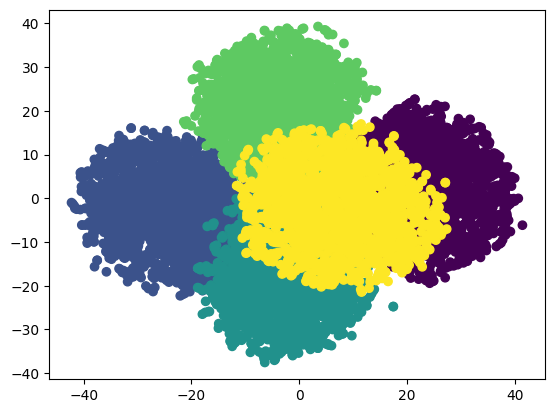

In [395]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [396]:
tsne.kl_divergence_

2.485682487487793

## umap

In [397]:
umap = umap.UMAP(n_components=3,random_state=42)

In [398]:
X_umap = umap.fit_transform(X_values)

In [399]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [400]:
umap_data

,dim_1,dim_2,dim_3,target
0,15.114246,5.542917,1.220642,0
1,15.204338,5.945826,1.009105,0
2,15.434921,6.141445,1.297320,0
3,16.498816,5.692418,1.309546,0
4,15.895557,6.161249,1.952187,0
...,...,...,...,...
9995,6.859694,-6.378583,3.294719,4
9996,7.024992,-5.999938,2.378656,4
9997,6.304565,-5.695182,2.990830,4
9998,7.124028,-6.521938,2.667784,4


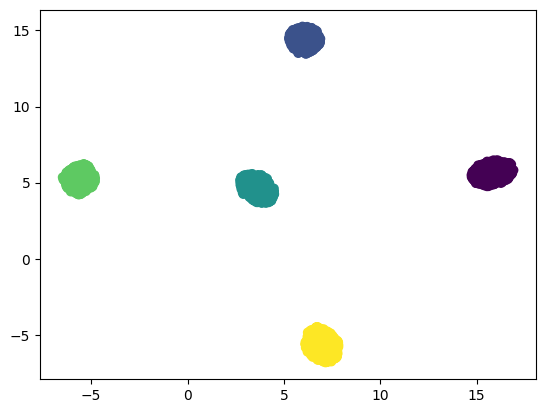

In [401]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [402]:
kmeans = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [403]:
kmeans.fit(X_values)

KMeans(n_clusters=5, random_state=42)

In [404]:
df_kmeans = corr_dataset.copy()

In [405]:
df_kmeans['k_means'] = kmeans.labels_

In [406]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [407]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [408]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


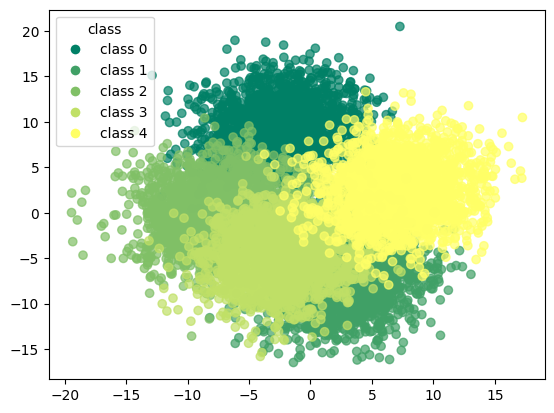

In [409]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

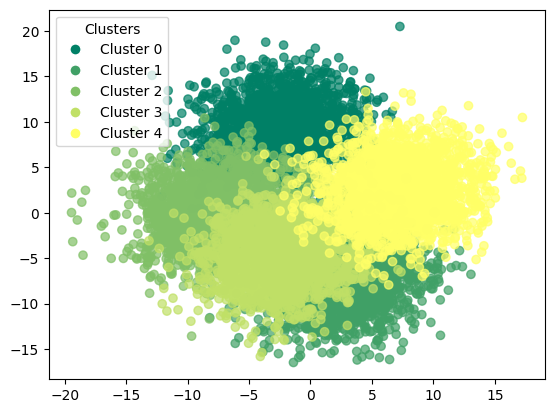

In [410]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [411]:
kmeans.cluster_centers_

array([[ 0.47670072, -1.09377407, -0.45757562, -0.31113193,  0.90199122,
         1.02842133, -0.30716116, -0.73029632,  0.15909467, -1.14929057,
         0.26124873, -1.09781319, -1.06046179,  0.83080314,  1.04430362,
         0.58110523, -0.32951319, -0.69223585,  1.26638072,  0.90097253],
       [ 1.32271698,  0.40777074, -0.32252536, -1.22380558,  0.09166294,
        -0.61670433,  1.56035853, -0.1429914 ,  1.13870064, -0.02749622,
        -0.92861376,  0.41586509,  0.56845893, -0.38457773,  0.4335979 ,
        -0.42313538,  0.43844366,  0.70962895, -0.96675641, -0.74021978],
       [-0.32930481,  1.39718854,  0.85883139,  0.4549501 , -0.72235879,
        -1.21523958, -0.81549978,  0.92521656,  0.19040197,  0.60259518,
        -1.19591838,  1.1264141 ,  0.72250808, -1.50953267, -1.51883376,
        -1.45003353, -0.33087513,  1.07386802,  0.40293645,  0.20940931],
       [-0.28429076, -0.70000335,  1.14936642, -0.29844315, -0.08040573,
         0.19070335, -0.52373174,  0.62268481, -

In [412]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [413]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### k-means with pca

In [414]:
kmeans_pca = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [415]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=5, random_state=42)

In [416]:
df_pca_kmeans = corr_dataset.copy()

In [417]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [418]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [419]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [420]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


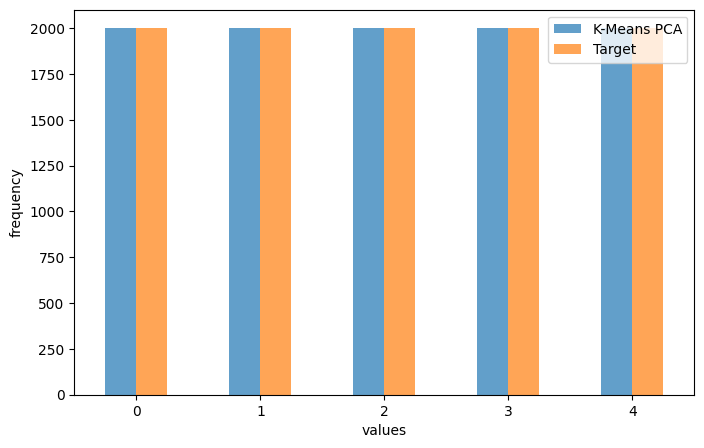

In [421]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [422]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [423]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



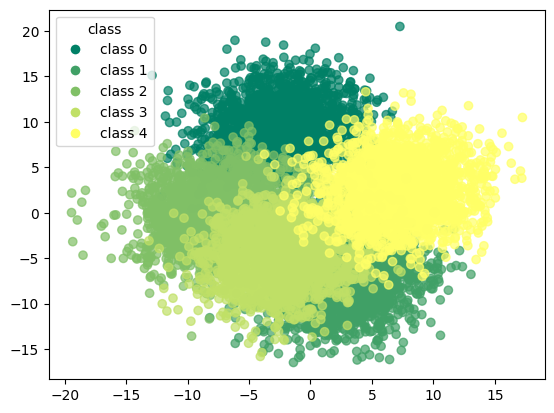

In [424]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

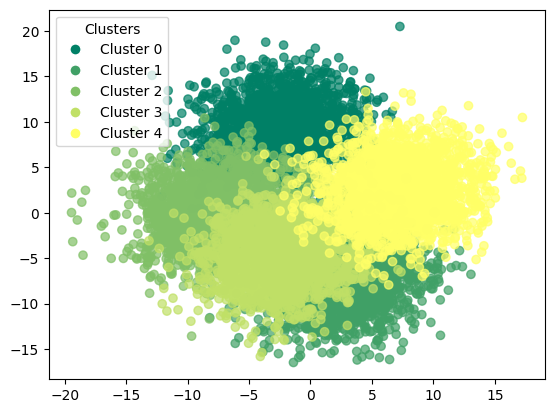

In [425]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

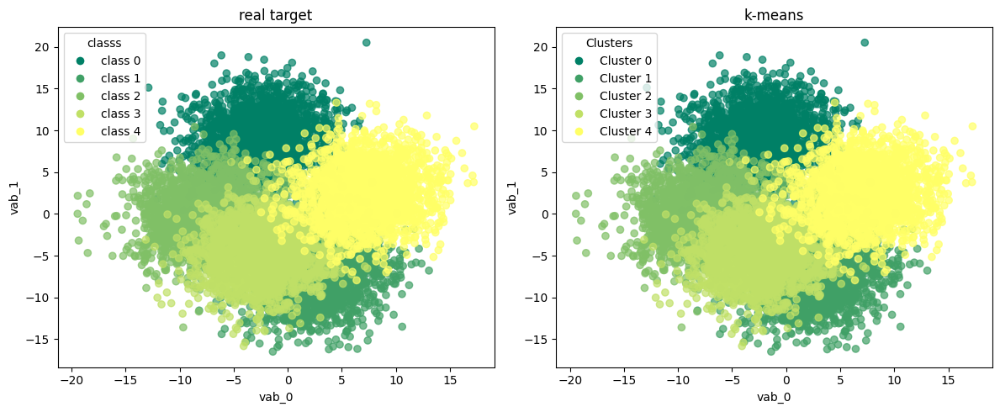

In [426]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

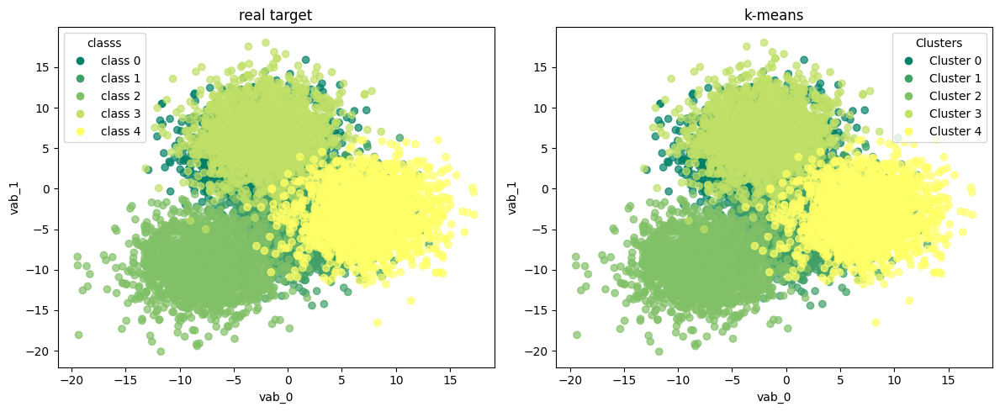

In [427]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

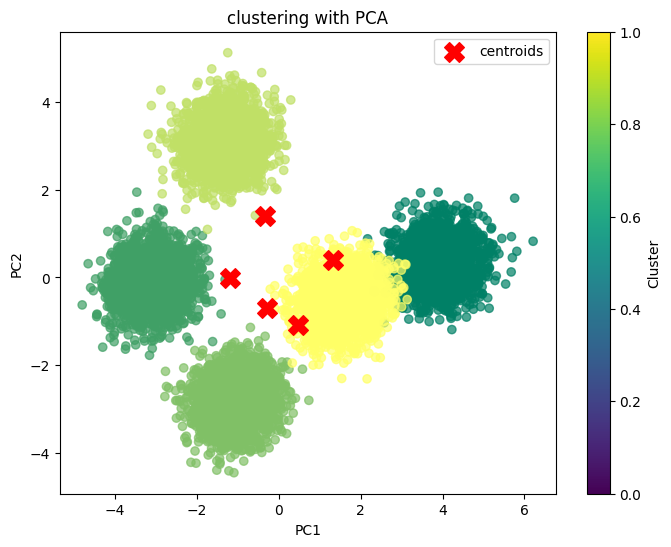

In [428]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

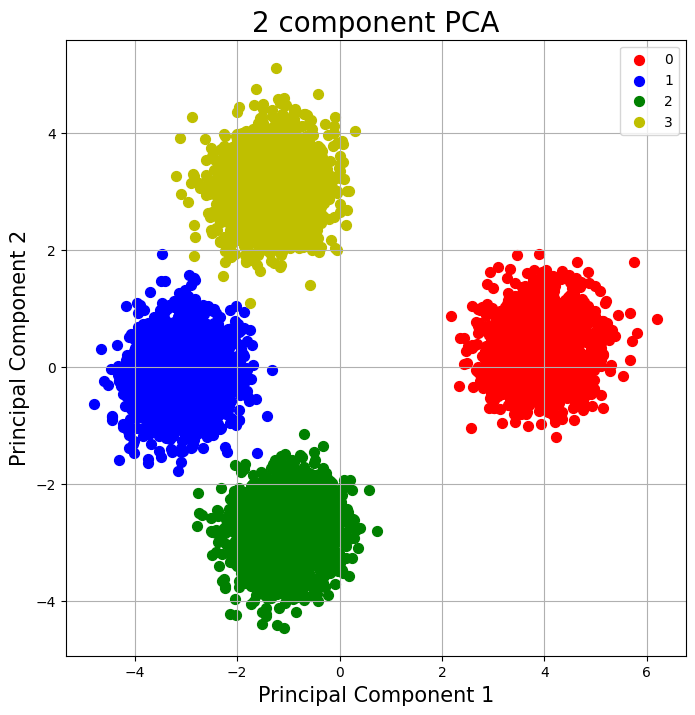

In [429]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [430]:
kmeans_tsne = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [431]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=5, random_state=42)

In [432]:
df_tsne_kmeans = corr_dataset.copy()

In [433]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [434]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,4
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,4
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,4
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,4
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [435]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.4
accuracy after: 0.9977


In [436]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


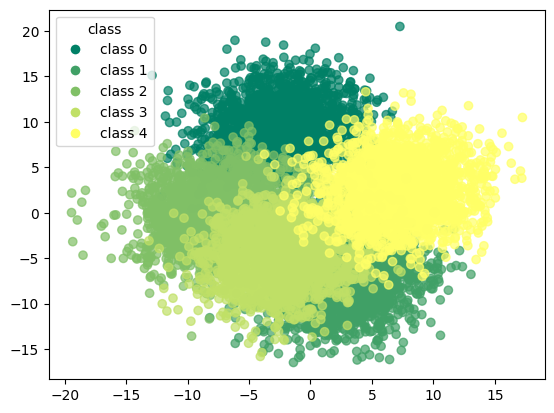

In [437]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

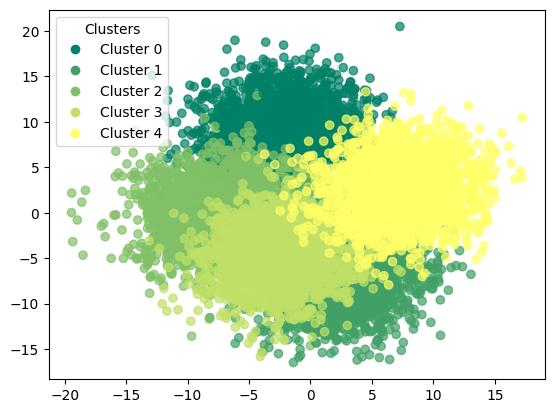

In [438]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

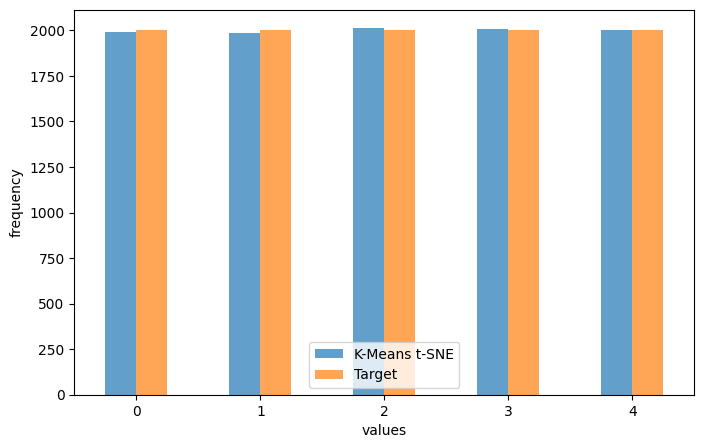

In [439]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [440]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1991    0    1    8    0]
 [   0 1987   12    0    1]
 [   0    0 2000    0    0]
 [   0    1    0 1999    0]
 [   0    0    0    0 2000]]


In [441]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      0.99      1.00      2000
           2       0.99      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### k-means with umap

In [442]:
kmeans_umap = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [443]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=5, random_state=42)

In [444]:
df_umap_kmeans = corr_dataset.copy()

In [445]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [446]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [447]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [448]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


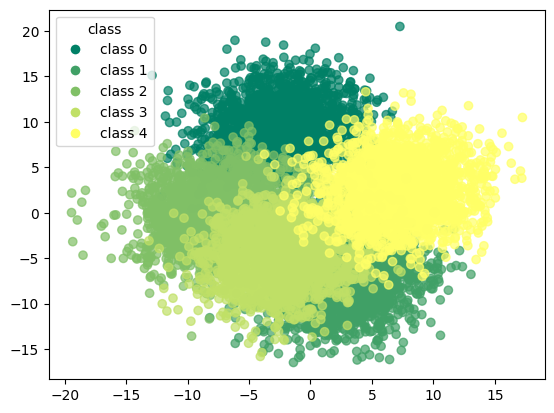

In [449]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

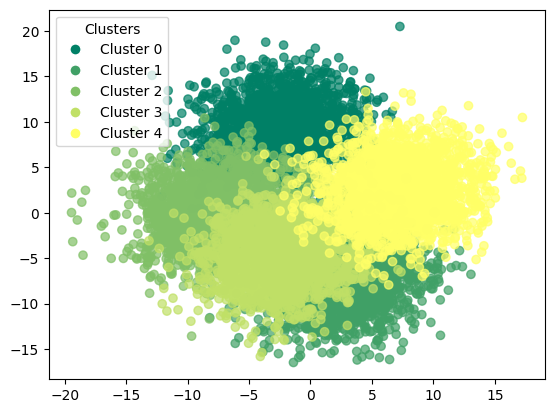

In [450]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

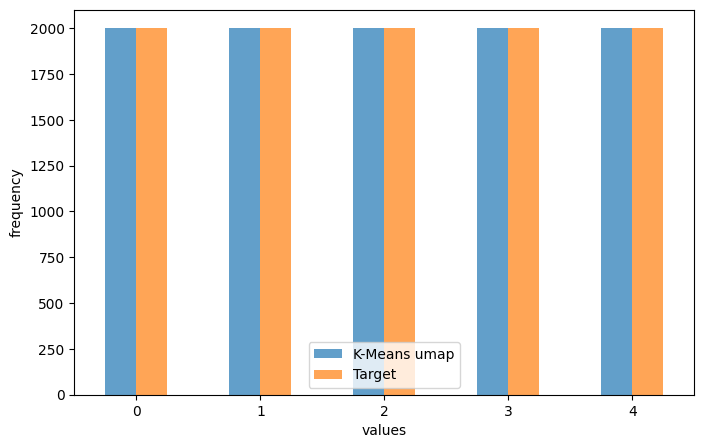

In [451]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [452]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [453]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## trimmed k-means

In [454]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [455]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=5,trim_fraction=0.1)

In [456]:
trimmed_kmeans

KMeans(n_clusters=5, random_state=42)

In [457]:
df_trim_kmeans = corr_dataset.copy()

In [458]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [459]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [460]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [461]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.09444444444444444
accuracy after: 0.7073333333333334


In [462]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


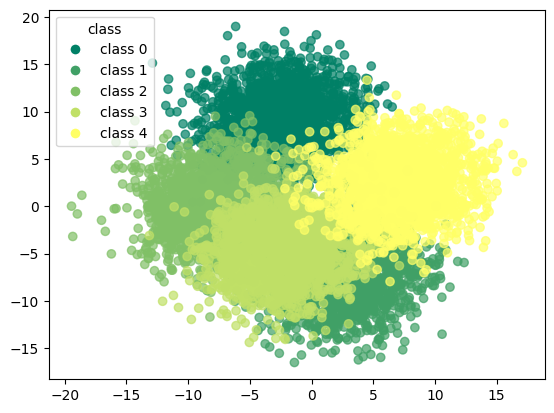

In [463]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

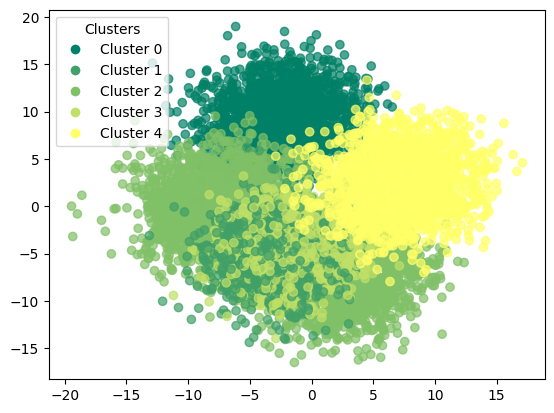

In [464]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [465]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1817    0    0    0    0]
 [   0    0 1781    3    0]
 [   0    0 1797    0    0]
 [   0  850    0  933    0]
 [   0    0    0    0 1819]]


In [466]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1817
           1       0.00      0.00      0.00      1784
           2       0.50      1.00      0.67      1797
           3       1.00      0.52      0.69      1783
           4       1.00      1.00      1.00      1819

    accuracy                           0.71      9000
   macro avg       0.70      0.70      0.67      9000
weighted avg       0.70      0.71      0.67      9000



### trimmed k-means with pca

In [467]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=5,trim_fraction=0.1)

In [468]:
trim_kmeans_pca

KMeans(n_clusters=5, random_state=42)

In [469]:
df_pca_trim_kmeans = corr_dataset.copy()

In [470]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [471]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [472]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [473]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.19777777777777777
accuracy after: 0.9971111111111111


In [474]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


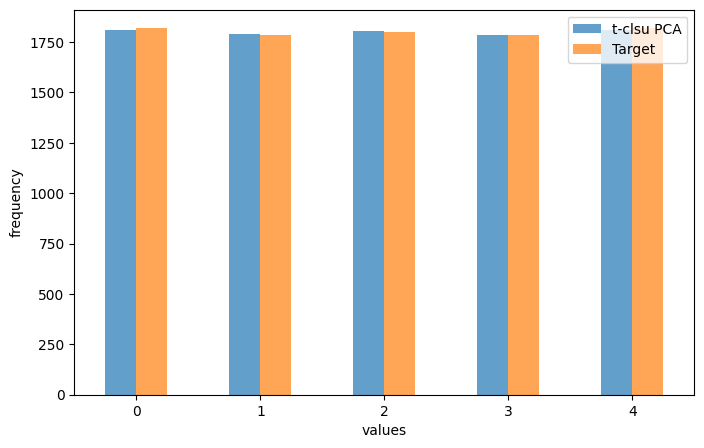

In [475]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [476]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1811    6    0    0    0]
 [   0 1784    0    0    0]
 [   0    0 1797    0    0]
 [   0    0    9 1774    0]
 [   0    0    0   11 1808]]


In [477]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1817
           1       1.00      1.00      1.00      1784
           2       1.00      1.00      1.00      1797
           3       0.99      0.99      0.99      1783
           4       1.00      0.99      1.00      1819

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



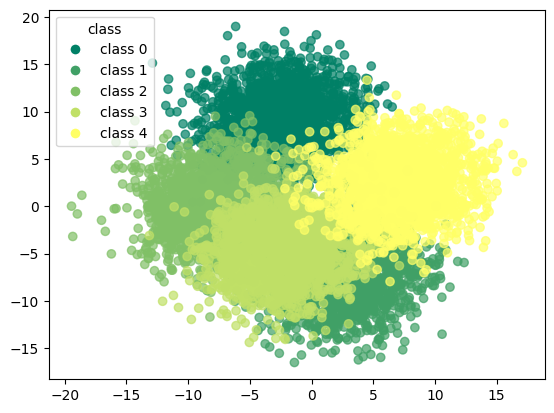

In [478]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

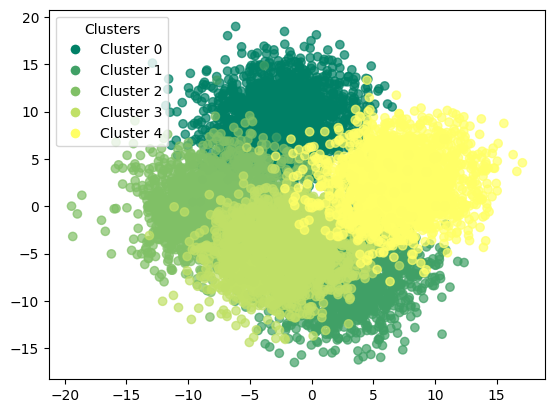

In [479]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

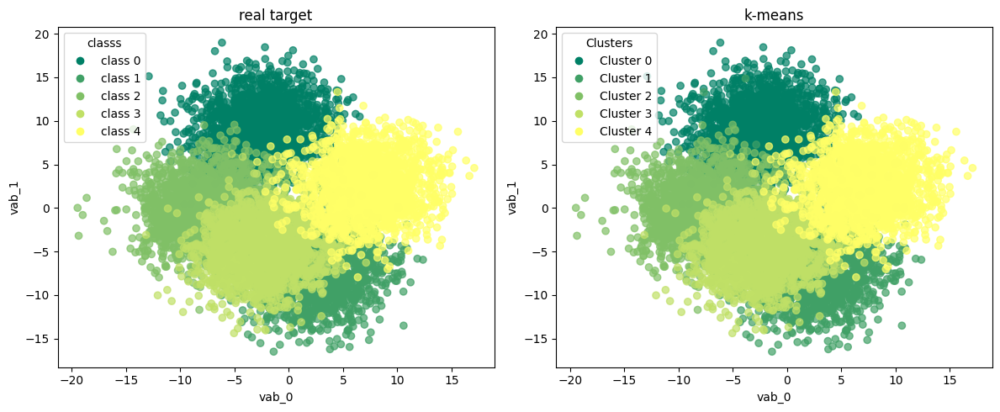

In [480]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

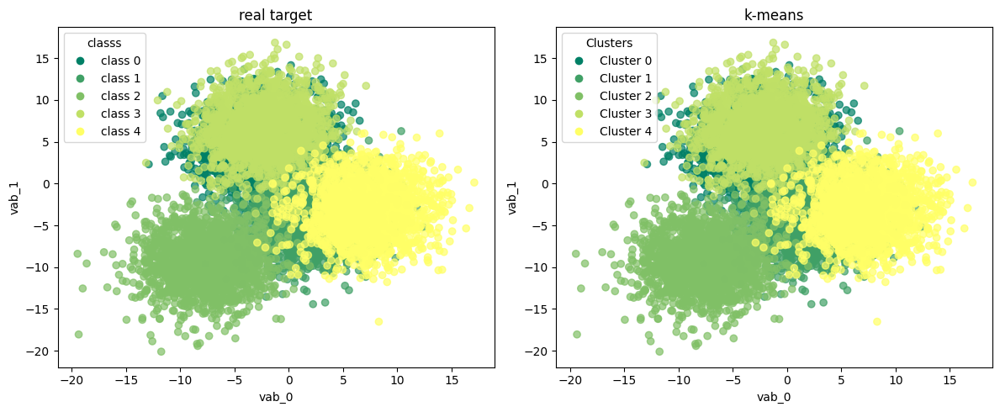

In [481]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [482]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=5,trim_fraction=0.1)

In [483]:
trim_kmeans_tsne

KMeans(n_clusters=5, random_state=42)

In [484]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [485]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [486]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [487]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,3
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,3
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,3
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,3


In [488]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.0022222222222222222
accuracy after: 0.9904444444444445


In [489]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


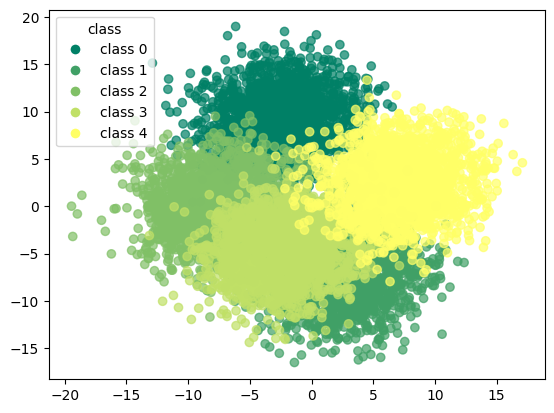

In [490]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

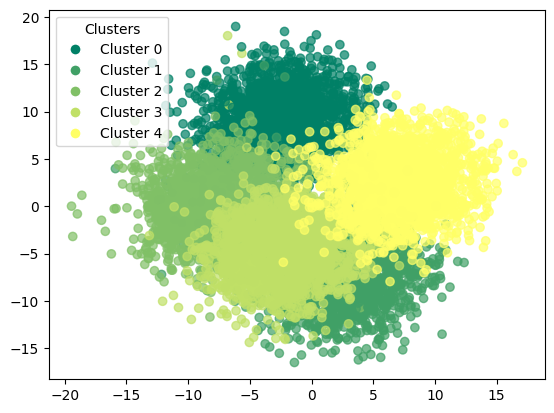

In [491]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

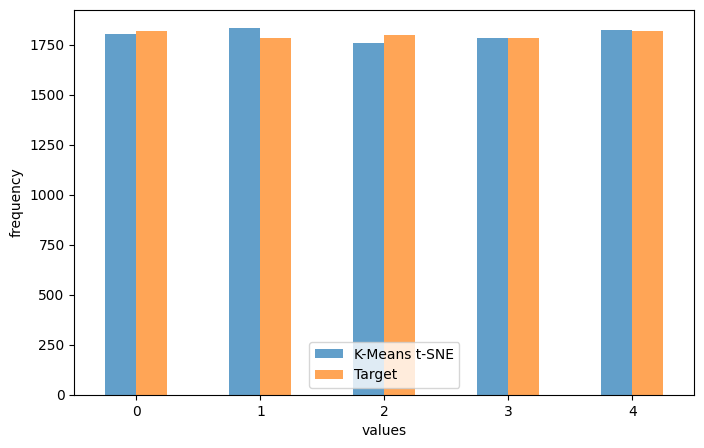

In [492]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [493]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1803    7    1    6    0]
 [   0 1772   11    0    1]
 [   0   54 1743    0    0]
 [   0    0    4 1777    2]
 [   0    0    0    0 1819]]


In [494]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1817
           1       0.97      0.99      0.98      1784
           2       0.99      0.97      0.98      1797
           3       1.00      1.00      1.00      1783
           4       1.00      1.00      1.00      1819

    accuracy                           0.99      9000
   macro avg       0.99      0.99      0.99      9000
weighted avg       0.99      0.99      0.99      9000



### trimmed k-means with umap

In [495]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=5,trim_fraction=0.1)

In [496]:
trim_kmeans_umap

KMeans(n_clusters=5, random_state=42)

In [497]:
df_umap_trim_kmeans = corr_dataset.copy()

In [498]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [499]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [500]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [501]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.19577777777777777
accuracy after: 1.0


In [502]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


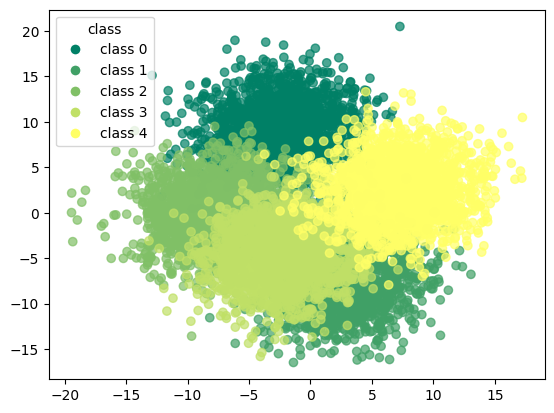

In [503]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

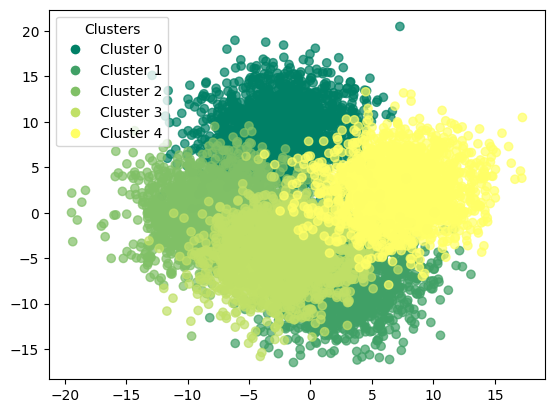

In [504]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

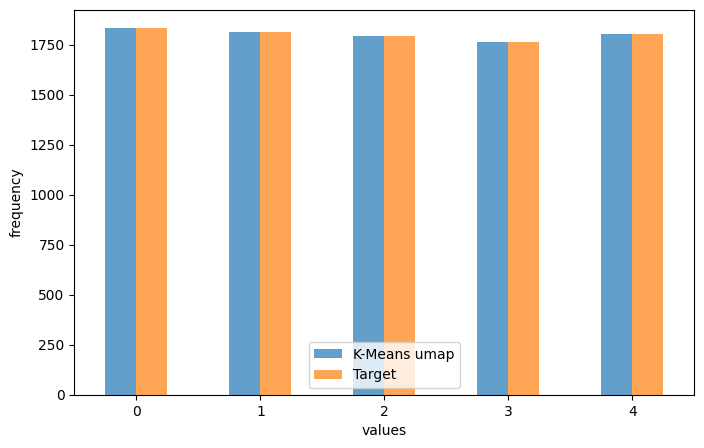

In [505]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [506]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1833    0    0    0    0]
 [   0 1811    0    0    0]
 [   0    0 1792    0    0]
 [   0    0    0 1762    0]
 [   0    0    0    0 1802]]


In [507]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1833
           1       1.00      1.00      1.00      1811
           2       1.00      1.00      1.00      1792
           3       1.00      1.00      1.00      1762
           4       1.00      1.00      1.00      1802

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



## dbscan

In [508]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

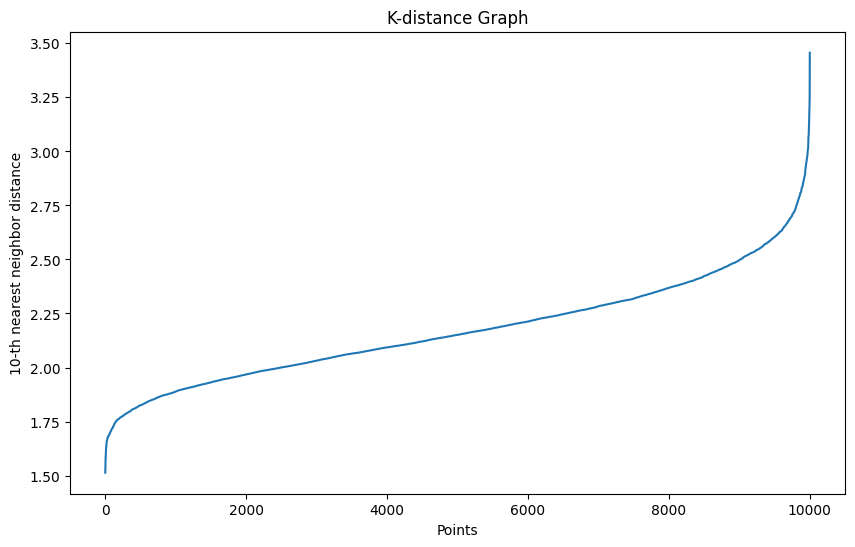

In [509]:
plot_k_distance_graph(X_values,k=10) 

In [510]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [511]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [512]:
df_dbscan = corr_dataset.copy()

In [513]:
df_dbscan['dbscan'] = dbscan.labels_

In [514]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [515]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,-1
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,-1
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,-1
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,-1
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,-1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,-1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,-1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,-1


In [516]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    10000
Name: count, dtype: int64


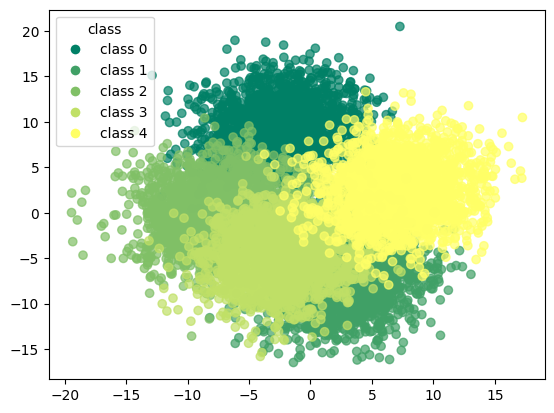

In [517]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

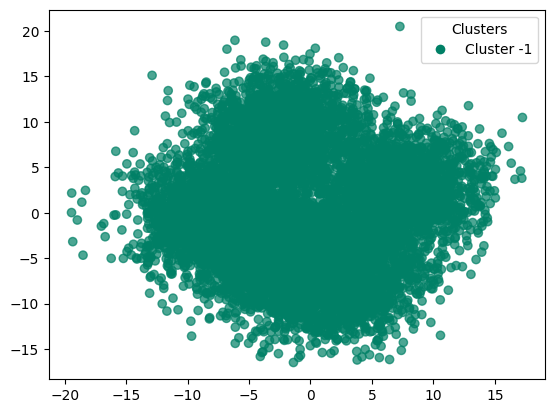

In [518]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [519]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


In [520]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



### dbscan with pca

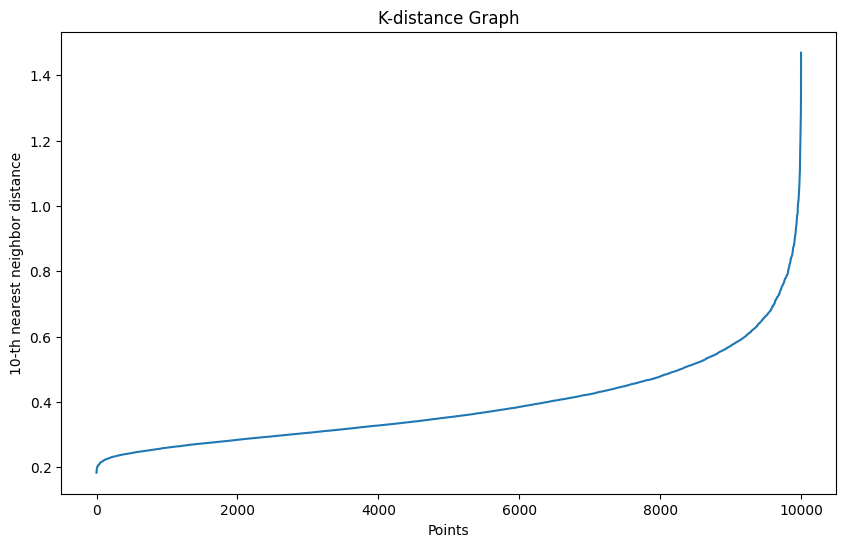

In [521]:
plot_k_distance_graph(X_pca,k=10)

In [522]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [523]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [524]:
df_pca_dbscan = corr_dataset.copy()

In [525]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [526]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.3313
accuracy after: 0.6588


In [527]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,-1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,-1


In [528]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
-1    1747
 0    1663
 6    1660
 4    1651
 1    1650
 3    1624
 2       5
Name: count, dtype: int64


In [529]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0    0    0    0]
 [ 337 1663    0    0    0    0    0]
 [ 345    0 1650    5    0    0    0]
 [ 340    0    0    0    0    0 1660]
 [ 376    0    0    0 1624    0    0]
 [ 349    0    0    0    0 1651    0]
 [   0    0    0    0    0    0    0]]


In [530]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.83      0.91      2000
           1       1.00      0.82      0.90      2000
           2       0.00      0.00      0.00      2000
           3       1.00      0.81      0.90      2000
           4       1.00      0.83      0.90      2000
           6       0.00      0.00      0.00         0

    accuracy                           0.66     10000
   macro avg       0.57      0.47      0.52     10000
weighted avg       0.80      0.66      0.72     10000



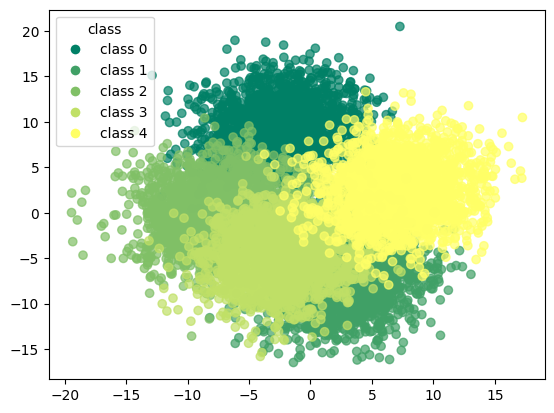

In [531]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

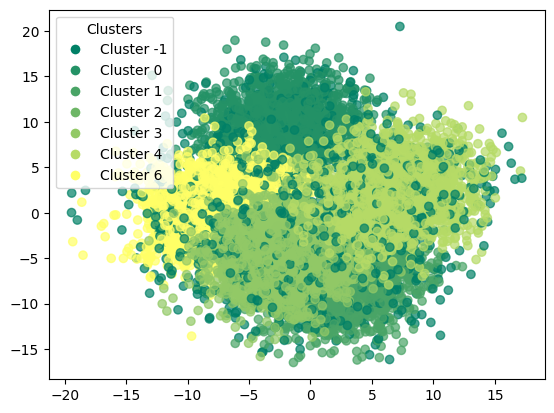

In [532]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

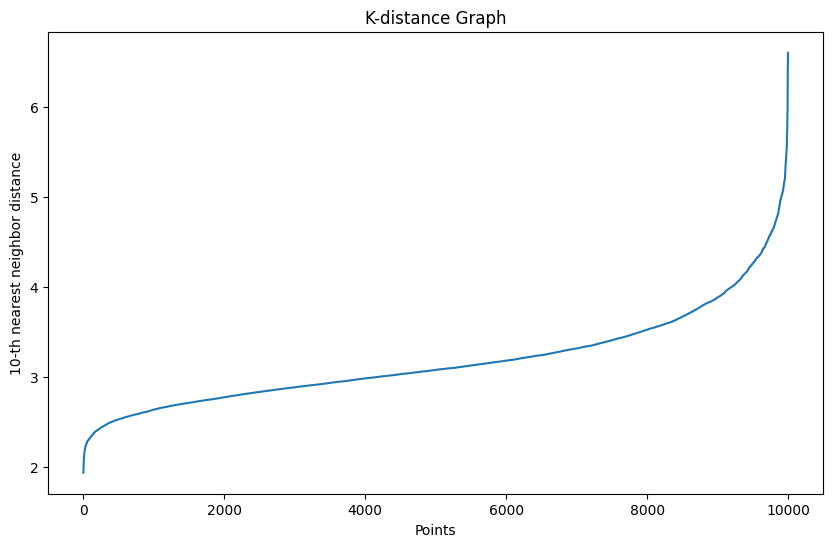

In [533]:
plot_k_distance_graph(X_tsne,k=10)

In [534]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [535]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [536]:
df_tsne_dbscan = corr_dataset.copy()

In [537]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [538]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.147
accuracy after: 0.147


In [539]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,41
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,-1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,41
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,41


In [540]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1     1767
 41    1584
 24    1541
 14    1527
 32    1521
 0     1470
 26      38
 42      34
 7       33
 4       33
 2       31
 43      28
 6       27
 31      26
 27      18
 1       18
 37      17
 19      17
 44      17
 5       15
 8       15
 20      14
 11      13
 39      12
 33      12
 25      12
 29      11
 35      11
 38      10
 28      10
 21      10
 16      10
 12       9
 17       9
 30       8
 22       8
 34       8
 23       8
 9        7
 36       7
 15       7
 40       7
 13       7
 18       5
 3        4
 10       4
Name: count, dtype: int64


In [541]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [ 397 1470   18 ...    0    0    0]
 [ 354    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


In [542]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.73      0.85      2000
           1       0.00      0.00      0.00      2000
           2       0.00      0.00      0.00      2000
           3       0.00      0.00      0.00      2000
           4       0.00      0.00      0.00      2000
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

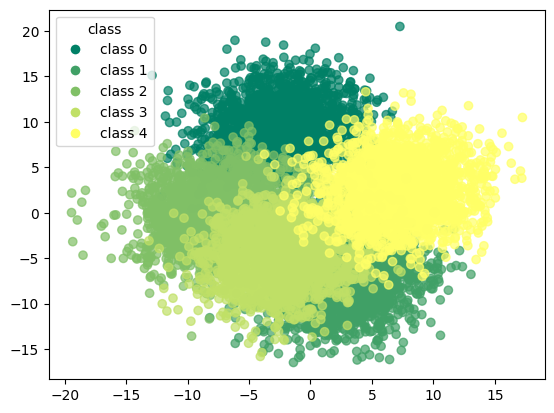

In [543]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

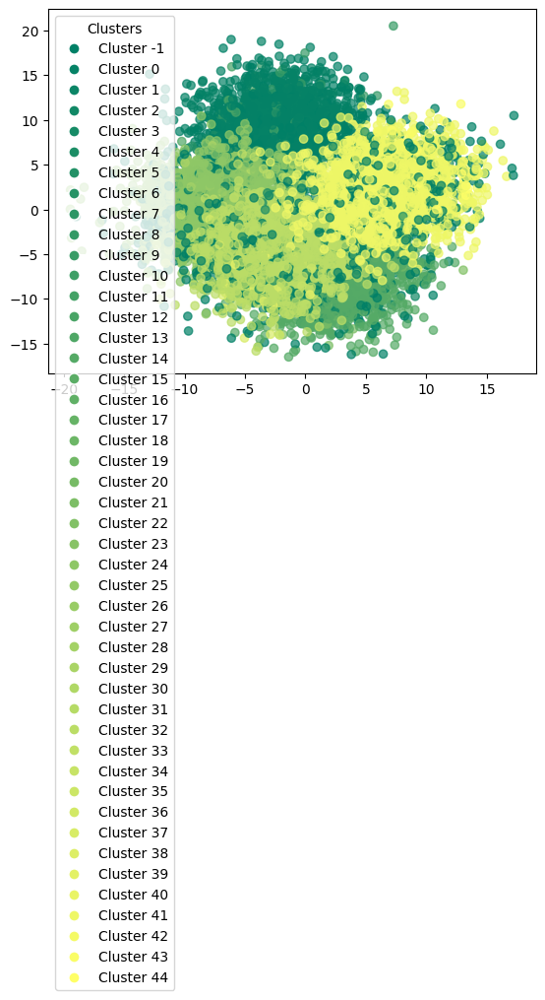

In [544]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

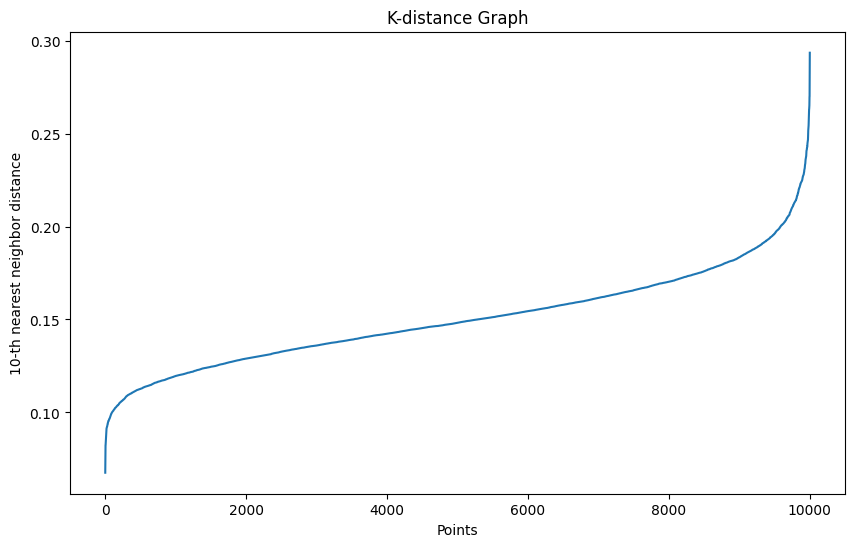

In [545]:
plot_k_distance_graph(X_umap,k=10)

In [546]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [547]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [548]:
df_umap_dbscan = corr_dataset.copy()

In [549]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [550]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [551]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


In [552]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    2000
1    2000
2    2000
3    2000
4    2000
Name: count, dtype: int64


In [553]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [554]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## GMM - Gaussian Mixture Models

In [555]:
gmm = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [556]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [557]:
df_gmm = corr_dataset.copy()

In [558]:
df_gmm['gmm'] = gmm.predict(X_values)

In [559]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [560]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [561]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


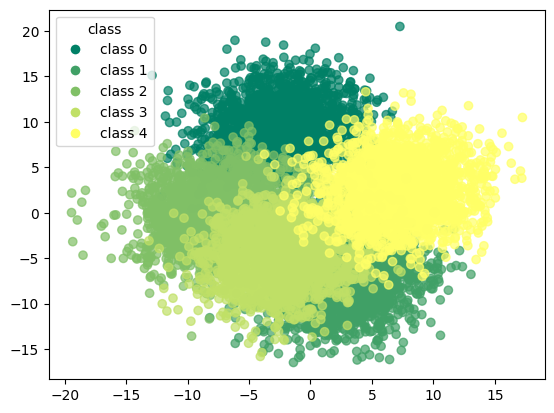

In [562]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

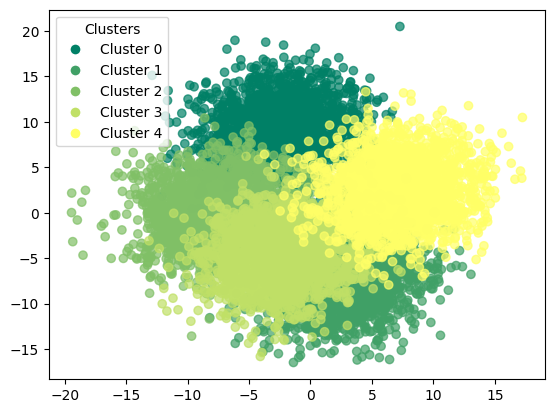

In [563]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [564]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [565]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### GMM with pca

In [566]:
gmm_pca = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [567]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [568]:
df_pca_gmm = corr_dataset.copy()

In [569]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [570]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [571]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


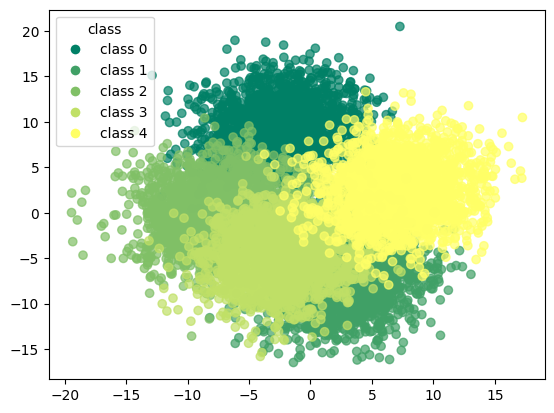

In [572]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

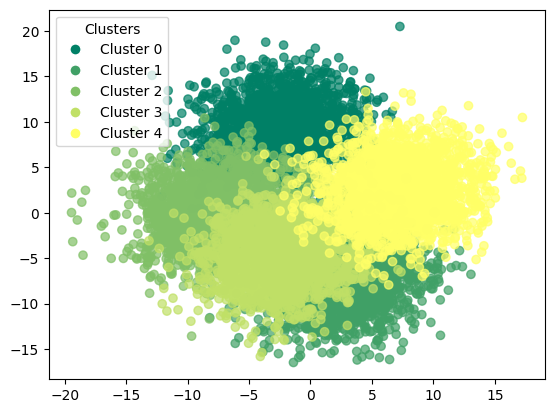

In [573]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [574]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [575]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### GMM with t-SNE

In [576]:
gmm_tsne = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [577]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [578]:
df_tsne_gmm = corr_dataset.copy()

In [579]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [580]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,4
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,4
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,4
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [581]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.5213
accuracy after: 0.7225


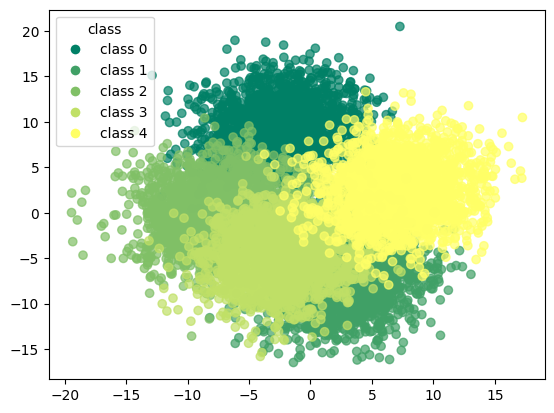

In [582]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

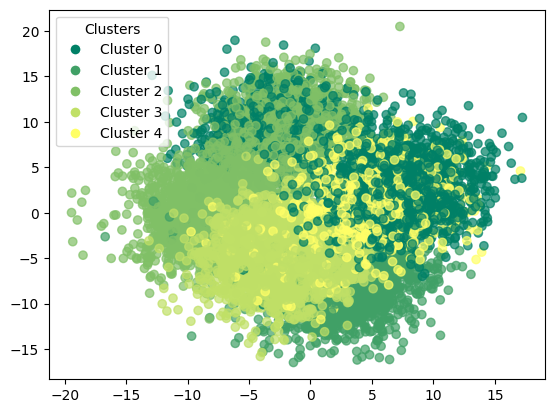

In [583]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [584]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[ 821    0 1179    0    0]
 [   0 1998    0    0    2]
 [   0   31 1969    0    0]
 [   3    0    9 1845  143]
 [1397   11    0    0  592]]


In [585]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.37      0.41      0.39      2000
           1       0.98      1.00      0.99      2000
           2       0.62      0.98      0.76      2000
           3       1.00      0.92      0.96      2000
           4       0.80      0.30      0.43      2000

    accuracy                           0.72     10000
   macro avg       0.76      0.72      0.71     10000
weighted avg       0.76      0.72      0.71     10000



### GMM with umap

In [586]:
gmm_umap = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [587]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [588]:
df_umap_gmm = corr_dataset.copy()

In [589]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [590]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,1
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,1
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,1
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,1


In [591]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


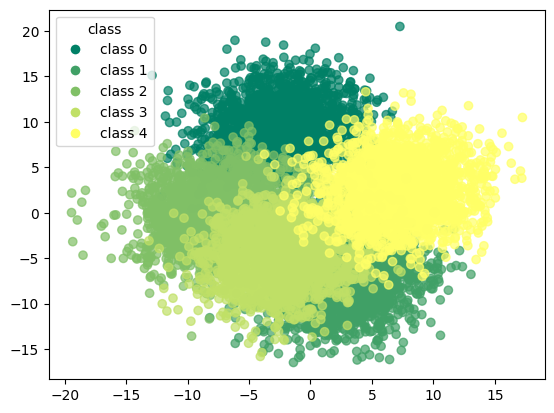

In [592]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

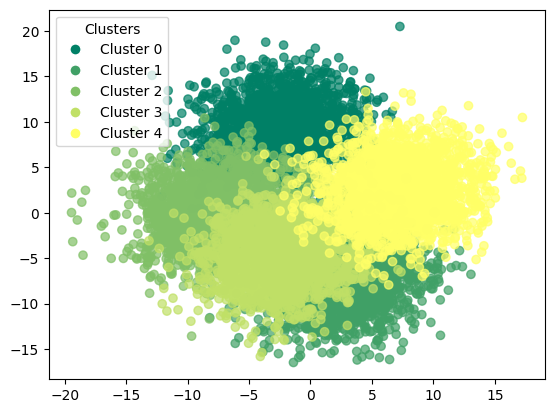

In [593]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [594]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [595]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## pam

In [596]:
initial_medoids = np.random.choice(len(X_values),5,replace=False)

In [597]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [598]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [599]:
pam.process()

In [600]:
clusters = pam.get_clusters()

In [601]:
medoids = pam.get_medoids()

In [602]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [603]:
df_pam = corr_dataset.copy()

In [604]:
df_pam['pam'] = labels

In [605]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,1.0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,1.0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,1.0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,1.0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,0.0
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,0.0
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,0.0
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,0.0


In [606]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0
accuracy after: 0.9999


In [607]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


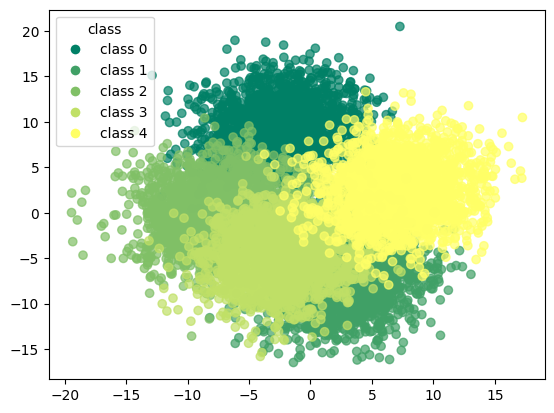

In [608]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

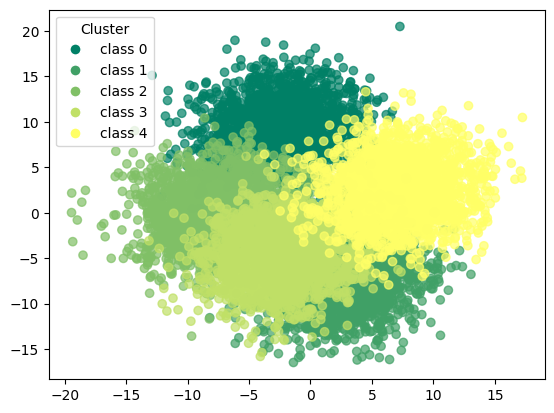

In [609]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [610]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 1999    0    1]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [611]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### pam with pca

In [612]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [613]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [614]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [615]:
pam_pca.process()

In [616]:
clusters = pam_pca.get_clusters()

In [617]:
medoids = pam_pca.get_medoids()

In [618]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [619]:
df_pam_pca = corr_dataset.copy()

In [620]:
df_pam_pca['pam_pca'] = labels

In [621]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,1.0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,1.0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,1.0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,1.0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,3.0
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,3.0
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,3.0
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,3.0


In [622]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [623]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


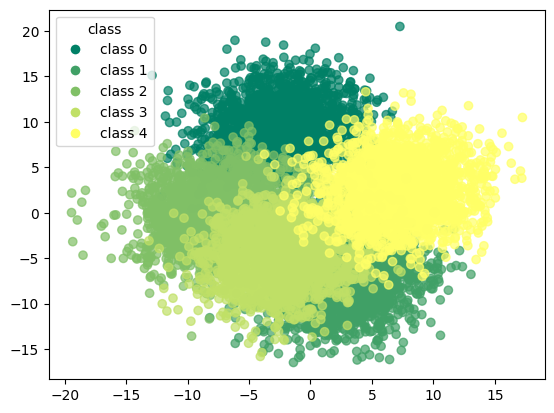

In [624]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

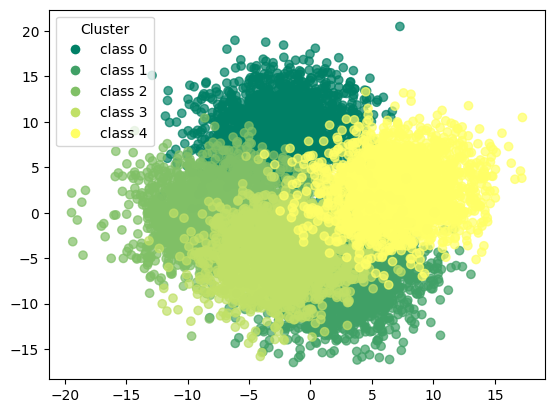

In [625]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [626]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [627]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### pam with t-SNE

In [628]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [629]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [630]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [631]:
pam_tsne.process()

In [632]:
clusters = pam_tsne.get_clusters()

In [633]:
medoids = pam_tsne.get_medoids()

In [634]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [635]:
df_pam_tsne = corr_dataset.copy()

In [636]:
df_pam_tsne['pam_tsne'] = labels

In [637]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2.0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2.0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2.0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2.0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,0.0
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,0.0
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,0.0
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,0.0


In [638]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0002
accuracy after: 0.9973


In [639]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


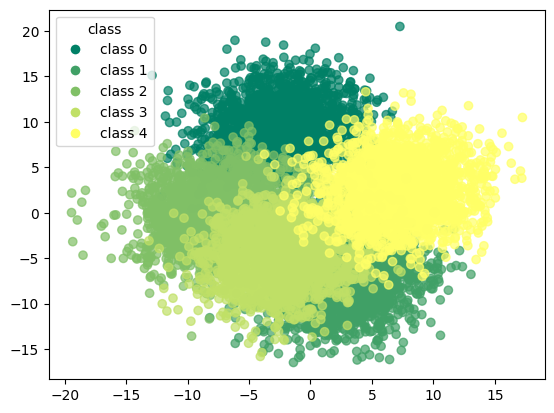

In [640]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

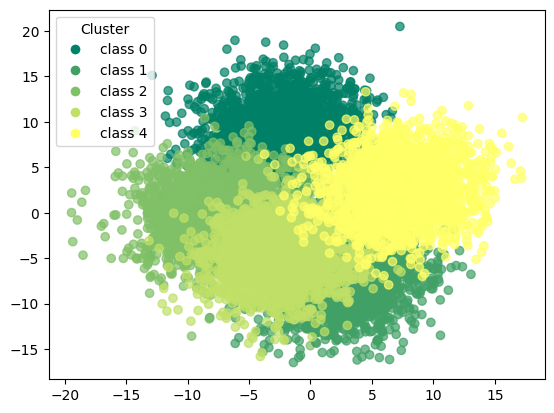

In [641]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [642]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1991    0    0    9    0]
 [   0 1986   12    0    2]
 [   2    0 1996    2    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [643]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      0.99      1.00      2000
           2       0.99      1.00      1.00      2000
           3       0.99      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### pam with umap

In [644]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [645]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [646]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [647]:
pam_umap.process()

In [648]:
clusters = pam_umap.get_clusters()

In [649]:
medoids = pam_umap.get_medoids()

In [650]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [651]:
df_pam_umap = corr_dataset.copy()

In [652]:
df_pam_umap['pam_umap'] = labels

In [653]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,2.0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,2.0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,2.0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,2.0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,3.0
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,3.0
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,3.0
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,3.0


In [654]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [655]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,1.693922,8.388475,0.347893,-3.178839,-8.771976,-12.367643,-7.949296,7.498866,1.727458,1.878990,...,7.019498,-4.728527,-7.482623,-10.386609,-1.391057,-1.333924,-1.990016,-4.361225,0,0
1,-3.527229,6.224354,5.176641,2.034441,-7.663618,-9.246260,-8.004325,4.269892,2.611293,4.127244,...,4.523365,-4.215909,-5.178472,-11.451843,-3.038907,0.116363,0.666292,-1.569856,0,0
2,-2.764994,6.869545,2.952443,2.413508,-7.198864,-5.987048,-6.034896,7.192839,1.116080,1.534305,...,5.891421,-9.590836,-4.363040,-9.233615,-5.155454,-2.007291,3.249510,0.088702,0,0
3,-0.186571,9.548787,6.259239,2.633773,-4.442118,-3.952533,-7.221278,8.220528,4.082386,6.850662,...,2.838851,-6.288157,-7.427486,-5.825431,-3.731143,1.562111,0.905985,-4.123074,0,0
4,0.326556,8.303480,2.546757,1.788749,-8.393837,-3.861706,-7.014144,11.337621,-0.673562,-0.615238,...,9.131412,-3.290921,-6.162036,-6.640556,-6.034180,3.821148,0.672698,4.664287,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.567177,-2.512903,-3.731335,-14.822792,-4.913712,-5.380083,3.085609,1.918224,7.730148,-0.117968,...,5.091153,2.386482,1.744166,-6.879883,3.038825,2.595324,-14.227204,-8.384949,4,4
9996,6.011302,4.905349,-0.689665,-11.093834,-2.765347,-3.767519,3.742667,-1.935549,10.891775,-3.384760,...,8.127021,5.438684,1.380036,-3.911235,-3.490860,-2.862612,-16.820697,-6.118335,4,4
9997,5.899917,-0.670331,-0.751855,-10.286359,-0.973713,-2.524496,0.765058,3.687873,6.750533,-0.621863,...,6.382115,4.611633,8.986771,-2.981992,4.081309,-1.818704,-9.490562,-10.250303,4,4
9998,4.383084,-1.713034,-3.858205,-8.430895,-2.917412,-1.365866,2.849096,-3.162120,6.262588,-3.815421,...,1.356102,4.495974,7.394478,4.659972,-4.029301,-1.447116,-14.791248,-10.360960,4,4


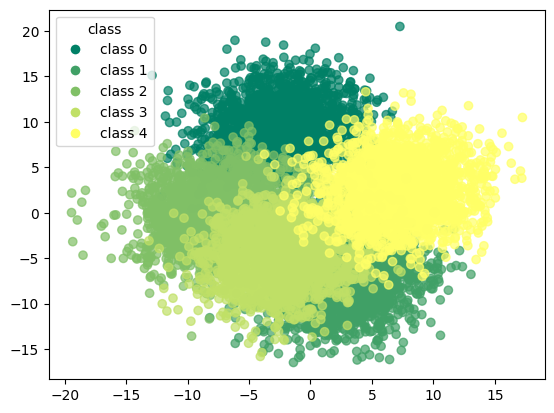

In [656]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

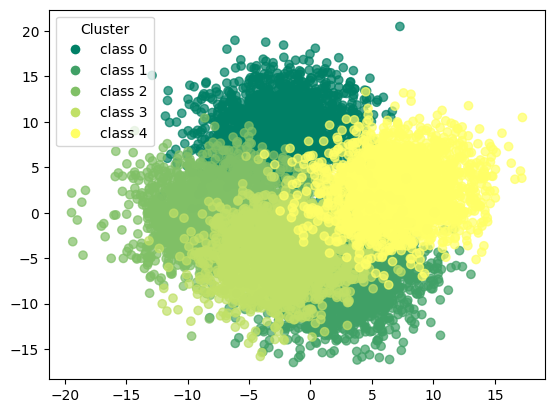

In [657]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [658]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [659]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



# overall results k-means

## basic

In [660]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [661]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


## + pca

In [662]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [663]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


## + t-SNE

In [664]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      0.99      1.00      2000
           2       0.99      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [665]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1991    0    1    8    0]
 [   0 1987   12    0    1]
 [   0    0 2000    0    0]
 [   0    1    0 1999    0]
 [   0    0    0    0 2000]]


## + UMAP

In [666]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [667]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


# overall results trimmed k-means

## basic

In [668]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1817
           1       0.00      0.00      0.00      1784
           2       0.50      1.00      0.67      1797
           3       1.00      0.52      0.69      1783
           4       1.00      1.00      1.00      1819

    accuracy                           0.71      9000
   macro avg       0.70      0.70      0.67      9000
weighted avg       0.70      0.71      0.67      9000



In [669]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1817    0    0    0    0]
 [   0    0 1781    3    0]
 [   0    0 1797    0    0]
 [   0  850    0  933    0]
 [   0    0    0    0 1819]]


## + pca

In [670]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1817
           1       1.00      1.00      1.00      1784
           2       1.00      1.00      1.00      1797
           3       0.99      0.99      0.99      1783
           4       1.00      0.99      1.00      1819

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



In [671]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1811    6    0    0    0]
 [   0 1784    0    0    0]
 [   0    0 1797    0    0]
 [   0    0    9 1774    0]
 [   0    0    0   11 1808]]


## + t-SNE

In [672]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1817
           1       0.97      0.99      0.98      1784
           2       0.99      0.97      0.98      1797
           3       1.00      1.00      1.00      1783
           4       1.00      1.00      1.00      1819

    accuracy                           0.99      9000
   macro avg       0.99      0.99      0.99      9000
weighted avg       0.99      0.99      0.99      9000



In [673]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1803    7    1    6    0]
 [   0 1772   11    0    1]
 [   0   54 1743    0    0]
 [   0    0    4 1777    2]
 [   0    0    0    0 1819]]


## + UMAP

In [674]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1833
           1       1.00      1.00      1.00      1811
           2       1.00      1.00      1.00      1792
           3       1.00      1.00      1.00      1762
           4       1.00      1.00      1.00      1802

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



In [675]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1833    0    0    0    0]
 [   0 1811    0    0    0]
 [   0    0 1792    0    0]
 [   0    0    0 1762    0]
 [   0    0    0    0 1802]]


# overall results dbscan

## basic

In [676]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



In [677]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


## + pca

In [678]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.83      0.91      2000
           1       1.00      0.82      0.90      2000
           2       0.00      0.00      0.00      2000
           3       1.00      0.81      0.90      2000
           4       1.00      0.83      0.90      2000
           6       0.00      0.00      0.00         0

    accuracy                           0.66     10000
   macro avg       0.57      0.47      0.52     10000
weighted avg       0.80      0.66      0.72     10000



In [679]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0    0    0    0]
 [ 337 1663    0    0    0    0    0]
 [ 345    0 1650    5    0    0    0]
 [ 340    0    0    0    0    0 1660]
 [ 376    0    0    0 1624    0    0]
 [ 349    0    0    0    0 1651    0]
 [   0    0    0    0    0    0    0]]


## + t-SNE

In [680]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.73      0.85      2000
           1       0.00      0.00      0.00      2000
           2       0.00      0.00      0.00      2000
           3       0.00      0.00      0.00      2000
           4       0.00      0.00      0.00      2000
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [681]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [ 397 1470   18 ...    0    0    0]
 [ 354    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + UMAP

In [682]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [683]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


# overall results GMM

## basic

In [684]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [685]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


## + pca

In [686]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [687]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


## + t-SNE

In [688]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.37      0.41      0.39      2000
           1       0.98      1.00      0.99      2000
           2       0.62      0.98      0.76      2000
           3       1.00      0.92      0.96      2000
           4       0.80      0.30      0.43      2000

    accuracy                           0.72     10000
   macro avg       0.76      0.72      0.71     10000
weighted avg       0.76      0.72      0.71     10000



In [689]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[ 821    0 1179    0    0]
 [   0 1998    0    0    2]
 [   0   31 1969    0    0]
 [   3    0    9 1845  143]
 [1397   11    0    0  592]]


## + UMAP

In [690]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [691]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


# overall results pam

## basic

In [692]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 1999    0    1]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [693]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## + pca

In [694]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [695]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## + t-SNE

In [696]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1991    0    0    9    0]
 [   0 1986   12    0    2]
 [   2    0 1996    2    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [697]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      0.99      1.00      2000
           2       0.99      1.00      1.00      2000
           3       0.99      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## + umap

In [698]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2000    0    0    0    0]
 [   0 2000    0    0    0]
 [   0    0 2000    0    0]
 [   0    0    0 2000    0]
 [   0    0    0    0 2000]]


In [699]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      1.00      1.00      2000
           2       1.00      1.00      1.00      2000
           3       1.00      1.00      1.00      2000
           4       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000

